# ⭐AIFFEL 대전 1기 Exploration 16. SRCNN, SRGAN⭐
>  프로젝트 소개: 저화질의 이미지를 고화질로 변경해보자

***

# 🎯 프로젝트 목표
   * Super Resolution에 대해 이해한다.  
   * SRCNN, SRGAN을 이해하고 적용해본다.  
   * 이해한 개념 실제로 구현해본다.

***

# ✅프로젝트 순서
## 0. 개념 정리
## 1. 프로젝트 1-1. 직접 고른 이미지로 SRGAN 실험 (1)
## 2. 프로젝트 1-1. 직접 고른 이미지로 SRGAN 실험 (2)
## 3. 프로젝트2. SRGAN을 이용해 고해상도 gif 생성하기
## 4. 회고
- 4-1. 루브릭  
- 4-2. 회고

***

# 0. 개념정리
## &#160;&#160;1. 픽셀
- 디스플레이를 구성하는 가장 작은 단위  

## &#160;&#160;2. RGB
- 빛의 3원색인 적,녹,청을 혼합해서 색을 나타내며 RGB각각을 Sub-Pixel이라고 하고, RGB 3개를 모아놓은  것을 One-Pixel이라고 한다.  

## &#160;&#160;3. Resolution(해상도)
- 픽셀 수가 많을수록 고해상도가 되어 선명해진다.  
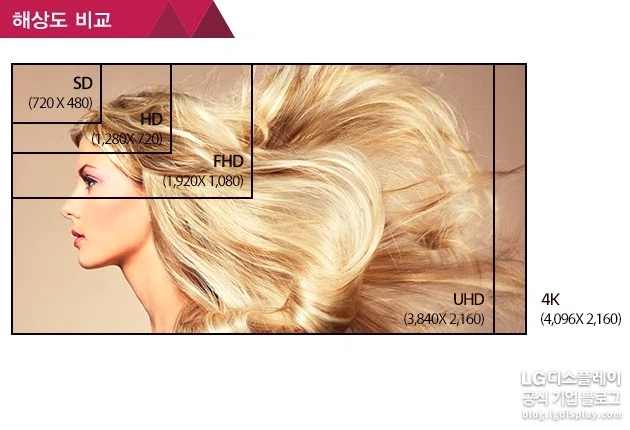
> 출처1: [LG Display Blog](https://blog.lgdisplay.com/2014/07/%EA%B7%B8%EB%A6%BC%EC%9C%BC%EB%A1%9C-%EC%89%BD%EA%B2%8C-%EC%95%8C%EC%95%84%EB%B3%B4%EB%8A%94-hd-%ED%95%B4%EC%83%81%EB%8F%84%EC%9D%98-%EC%B0%A8%EC%9D%B4/)  
> 출처2: [LG Display Blog](http://blog.lgdisplay.com/2014/03/%eb%aa%a8%eb%8b%88%ed%84%b0-%ed%95%b5%ec%8b%ac-%eb%94%94%ec%8a%a4%ed%94%8c%eb%a0%88%ec%9d%b4%ec%9d%98-%ec%8a%a4%ed%8e%99-%eb%94%b0%eb%9d%bc%ec%9e%a1%ea%b8%b0-%ed%95%b4%ec%83%81%eb%8f%84/)  

## &#160;&#160;4. Super Resolution(초해상도)
- 저해상도 영상을 고해상도 영상으로 변환하는 작업 또는 그러한 과정  
- 활용1: 영상 해상도 증폭  
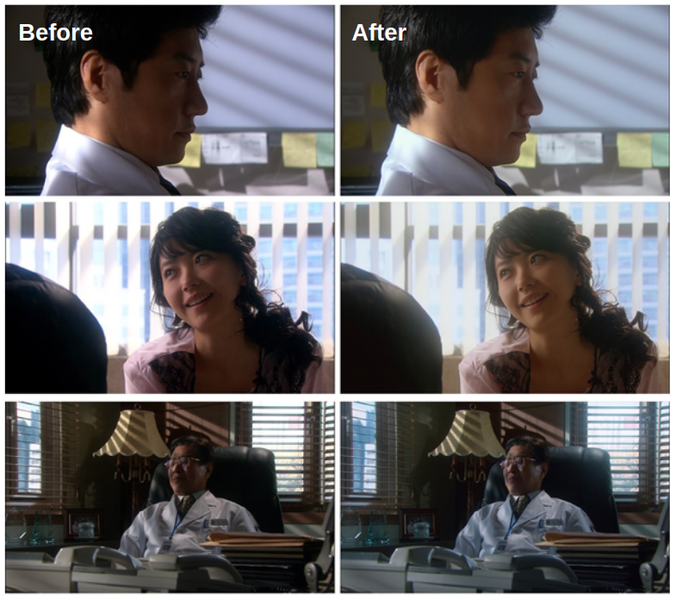
> 출처: http://tech.kobeta.com/하얀거탑-uhd-리마스터링-제작기/  

- CCTV 영상 해상도 증폭(범죄 수사에 이용)  
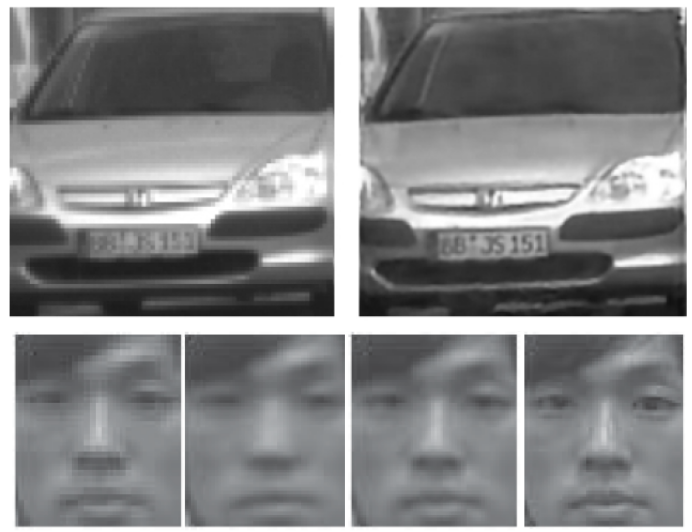
> 출처: https://link.springer.com/chapter/10.1007/978-3-642-03798-6_44, https://ieeexplore.ieee.org/document/6298425  

- 의료 영상 해상도 증폭(상세한 관찰 & 방사선 노출 최소)
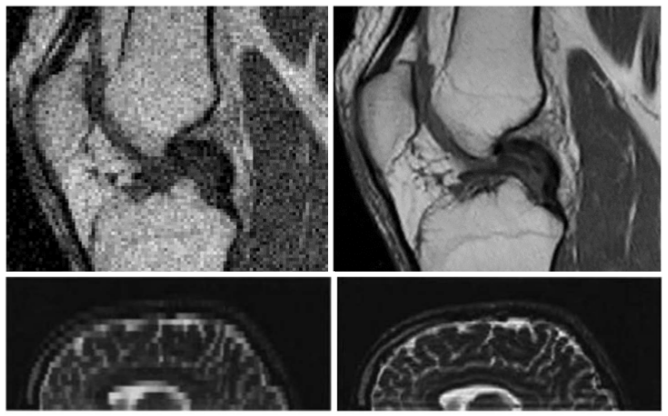
> 출처: https://www.sciencedirect.com/science/article/abs/pii/S0165168416300536  

## &#160;&#160;5. Super Resolution의 어려운 점 2가지
### &#160;&#160;&#160;1) 저해상도 이미지에서 다양한 고해상도 이미지가 나올 수 있다. 
### &#160;&#160;&#160;&#160;(ill-posed problem)
아래 사진을 보면 하나의 저해상도 사진(상단)에서 3장의 고해상도 사진을 얻었는데 픽셀 수가 차이남을 알 수 있다.  
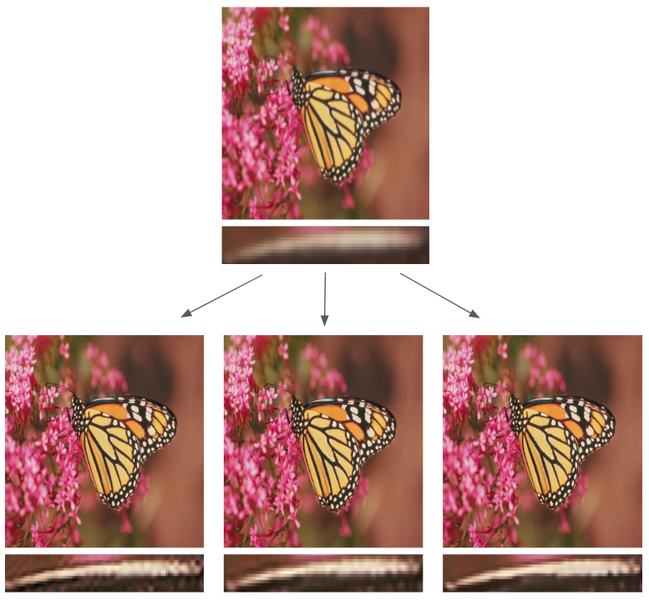
> 출처:https://arxiv.org/pdf/1808.03344.pdf  

### &#160;&#160;&#160;2) 정략적 척도와 사람이 관찰하여 내린 결과가 상이하다.
아래 사진 중 좌측 사진은 저해상도 이미지이며 우측은 고해상도로 초해상도를 진행했다.  
중간에 `결과1`과 `결과2`를 비교해보면 `결과2`가 더 고해상도로 느껴진다. 하지만 정략적 평가에서는 `결과1`이 더 고해상도로 판단된다. (아래 수치가 더 크다는 점을 보면 알 수 있다.)  
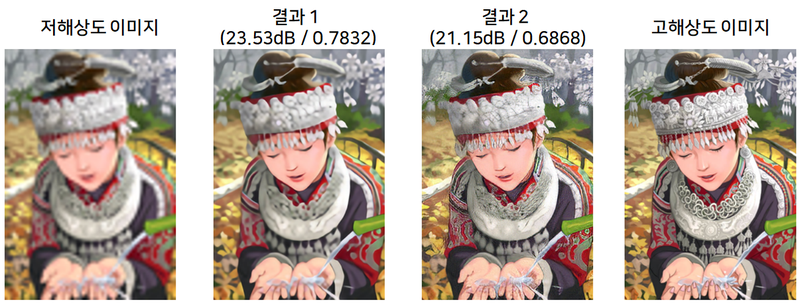  

## &#160;&#160;6. interploation(보간법)
- 알려진 값을 가진 두 점 사이 어느 지점의 값이 얼마인지를 추정하는 기법  
> 출처: [interploation](https://bskyvision.com/789)  

## &#160;&#160;7. Bilinear interpolation
- Linear interpolation을 2차원으로 확장시킨 것. 이웃한 4(2\*2)개의 점을 참조  
> 출처: [Bilinear interpolation](https://blog.naver.com/dic1224/220882679460)

## &#160;&#160;8. SRCNN(Super Resolution Convolutional Neural Networks)
- CNN을 이용한 Super Resolution  
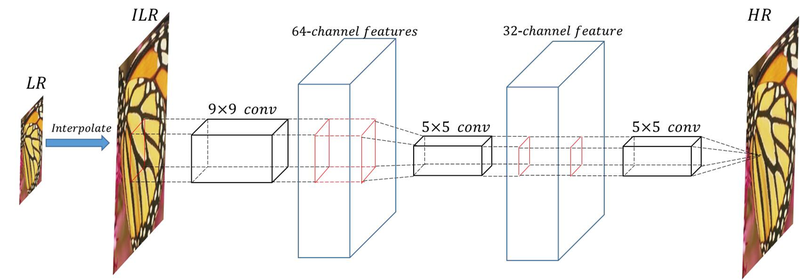
> 출처: https://aiffelstaticprd.blob.core.windows.net/media/images/e-22-9.srcnn.max-800x600.png  
- SRCNN의 3가지 연산  
1. Patch extraction and representation: 저해상도 이미지에서 patch를 추출하는 과정  
2. Non-linear mapping: 다차원 patch들을 non-linear하게 다른 다차원의 patch들로 매핑하는 과정  
3. Reconstruction: 다차원 patch들로부터 고해상도 이미지를 복원  
> 출처: https://d-tail.tistory.com/6  

## &#160;&#160;9. SRCNN 이후 제안된 구조 (1) - VDSR(Very Deep Super Solution)
- SRCNN과 동일하게 interpolation을 통해 저해상도 이미지의 크기를 늘려 입력으로 사용.  
- 이전보다 훨씬 많은 20개의 convolution layer를 사용. 최종 고해상도 이미지 생성 직전에 처음 입력 이미지를 더하는 residual learning을 이용.  
- 깊은 구조 덕분에 SRCNN에 비해 큰 성능 향상을 이끌어 냄.  

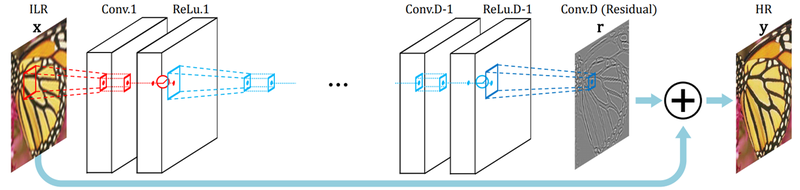
> 출처: https://aiffelstaticprd.blob.core.windows.net/media/images/e-22-10.vdsr.max-800x600.png  

## &#160;&#160;10. SRCNN 이후 제안된 구조 (2) - RDN(Residual Dense Network)
- 저해상도 이미지가 입력되면 여러 단계의 convolution layer를 거치는데 각 layer에서 나오는 출력을 최대한 활용.  
- 아래 그림과 같이 각각의 convolution layer 출력 결과로 생성된 특징들이 화살표를 따라 이후 연산에서 여러 번 재활용하는 것을 확인할 수 있다.  

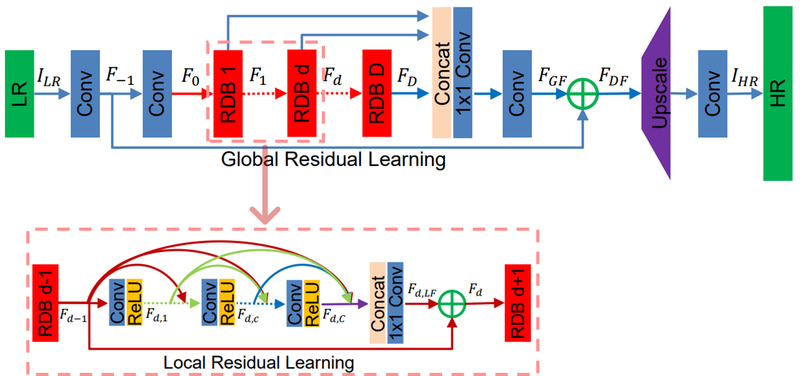
> 출처: https://aiffelstaticprd.blob.core.windows.net/media/images/e-22-11.rdn.max-800x600.png  

## &#160;&#160;11. SRCNN 이후 제안된 구조 (3) - RCAN(Residual Channel Attention Network)
- convolutional layer의 결과인 각각의 특징 맵을 대상으로 채널 간의 모든 정보가 균일한 중요도를 갖는 것이 아니라 **일부 중요한 채널에만 선택적으로 집중하도록 유도**(맨 위의 Channel attention이라 쓰인 부분)  

## &#160;&#160;12. SRGAN(Super Resolution GAN)
- GAN을 이용한 super resolution  
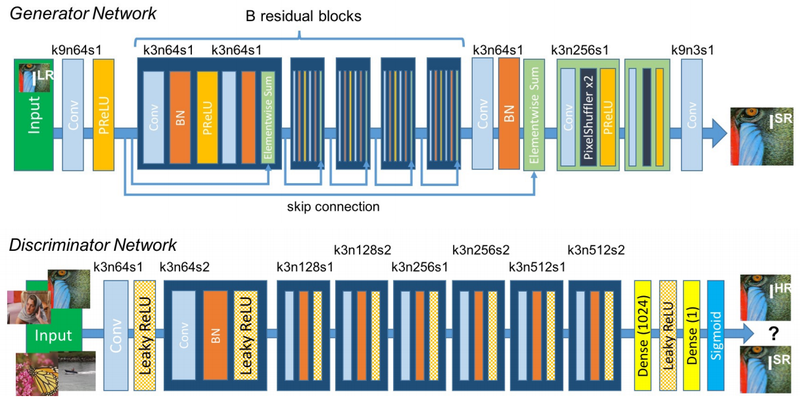
> 출처: https://aiffelstaticprd.blob.core.windows.net/media/images/e-22-14.srgan.max-800x600.png  

Generator가 저해상도 이미지를 입력 받아 (가짜)고해상도 이미지를 생성해 내면, Discriminator는 생성된 (가짜)고해상도 이미지와 실제(진짜) 고해상도 이미지 중 진짜를 판별  

Generator는 Discriminator를 속이려하고 Discriminator는 진짜를 가려내려는 학습이 진행될 수록 서로 경쟁자가 되어 둘 모두가 점점 발전합니다. 학습이 거의 완료 되면 최종적으로 Generator가 생성해낸 (가짜)고해상도 이미지는 Discriminator가 진짜인지 가짜인지를 구분하기 힘들 정도로 매우 좋은 품질을 가진 고해상도 이미지가 됩니다  


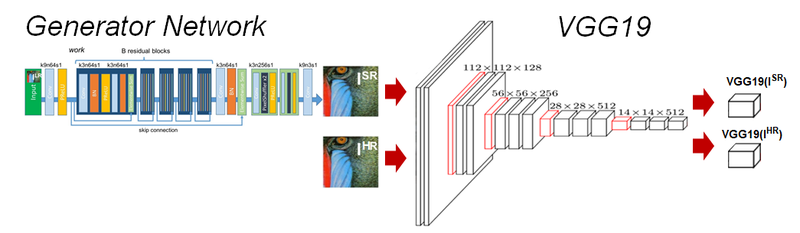
`content loss`는 Generator를 이용해 얻어낸 (가짜) 고해상도 이미지를 실제 (진짜) 고해상도 이미지와 직접 비교하는 것이 아니라, **각 이미지를 이미지넷으로 사전 학습된(pre-trained) VGG 모델에 입력하여 나오는 feature map에서의 차이를 계산**  

이전에 학습했던 SRCNN은 생성해낸 고해상도 이미지를 원래 고해상도 이미지와 직접 비교하여 loss를 계산했지만, **SRGAN에서는 생성된 고해상도 이미지와 실제 고해상도 이미지를 VGG에 입력하여 모델 중간에서 추출해낸 특징을 비교해서 loss를 계산**  

SRGAN은 VGG를 이용한 `content loss` 및 GAN을 사용함으로써 발생하는 `adversarial loss`를 합하여 최종적으로 `perceptual loss`라고 정의하며 이를 학습에 이용  

## &#160;&#160;13. SRGAN(Super Resolution GAN) 구현
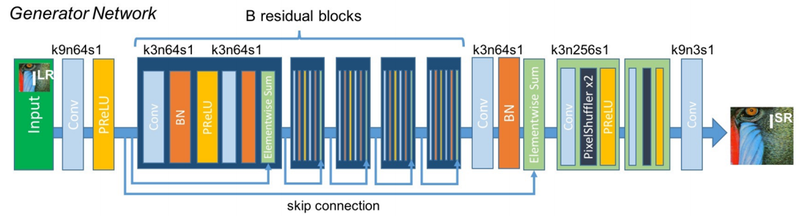
> 출처: https://arxiv.org/pdf/1609.04802.pdf  

`k9n64s1`라는 표기는 Convolutional layer 내의 hyperparameter 설정에 대한 정보이며, k는 kernel size, n은 사용 필터의 수, s는 stride  
Tensorflow로 구현한다면 `Conv2D(filters=64, kernel_size=9, strides=1, padding="same")` 처럼 작성  
SRGAN의 Generator에는 skip-connection을 가지고 있으며, 이는 Sequential API로 구현할 수 없으므로 Functional API를 이용  

생성된 고해상도 이미지와 진짜 고해상도 이미지 사이에서 진짜를 판별해내는 Discriminator를 아래 그림에 따라 구현해 보겠습니다. 마찬가지로 Functional API를 사용  
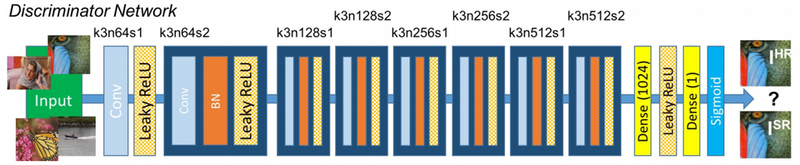
> 출처: https://arxiv.org/pdf/1609.04802.pdf  

## &#160;&#160;14. Super Resolution 평가하기
### 1) PSNR(Peak Singal-to-Noise Ratio)
- 영상 내 신호가 가질 수 있는 최대 신호에 대한 잡음 비율(높을수록 원본 영상에 비해 손실이 적다는 의미. 단위: db)  

### 2) SSIM(Structral Similarity Index Map)
- 영상의 구조 정보를 고려하여 얼마나 구조 정보를 변화시키지 않았는지를 계산.(높을수록 원본 영상의 품질에 가깝다는 의미.)  

> [참고자료: 최대신호 대 잡음비(PSNR)와 이미지 품질](https://bskyvision.com/392)  
> [참고자료: 2D 이미지 품질 평가에 구조변화를 반여하는 SSIM과 그의 변형들](https://bskyvision.com/396)  



## &#160;&#160;15. Super Resolution 다른 방법
### RefSR(Reference-based Super Resolution)
- 모델이 저해상도 이미지만을 받아서 고해상도 이미지를 생성하는 것이 아니라, 해상도를 높이는 데 참고할 만한 다른 이미지를 같이 제공해 주는 것  
- 여러 장의 저해상도 이미지를 잘 활용해 고해상도 이미지를 생성하는 컨셉  

이런 방법을 활용한 연구 중 'Image Super-Resolution by Neural Texture Transfer' 논문에서 제안한 방법을 사용하면 아래 그림과 같이 매우 선명한 고해상도 이미지를 얻을 수 있습니다. `Ref images`라고 나타난 두 이미지를 입력으로 Super Resolution을 수행했으며, `SRNTT`라고 나타난 결과를 보면 이전에 학습했던 SRGAN 보다 훨씬 더 선명한 것을 확인할 수 있습니다!  

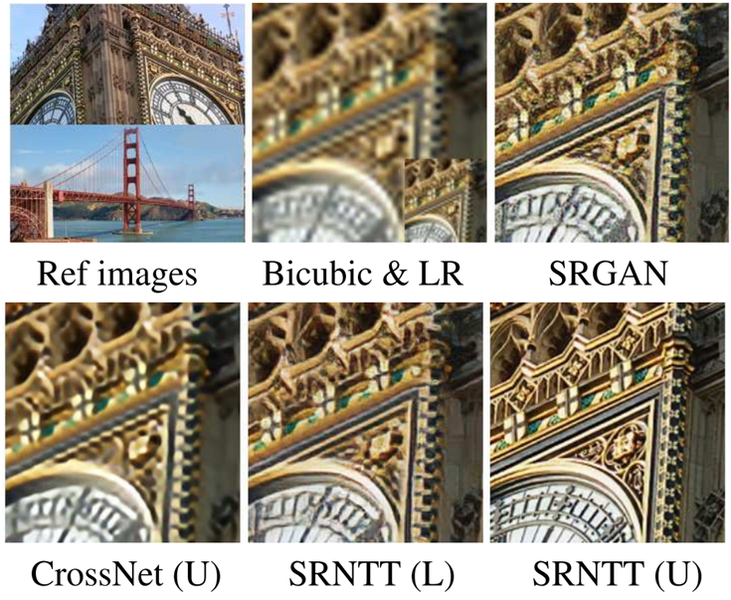
> 출처: https://openaccess.thecvf.com/content_CVPR_2019/papers/Zhang_Image_Super-Resolution_by_Neural_Texture_Transfer_CVPR_2019_paper.pdf  


## &#160;&#160;16. Super Resolution의 차별 사례
아래와 같이 저해상도에서 고해상도 이미지를 만든 결과를 보면 모두 백인으로 생성했다.  
이는 데이터셋이 치우친 영향이 가장 크다.  
실례로 동아시아에서 만든 얼굴 인식 알고리즘은 동양인의 얼굴을 더 잘 생성하게 했다.  
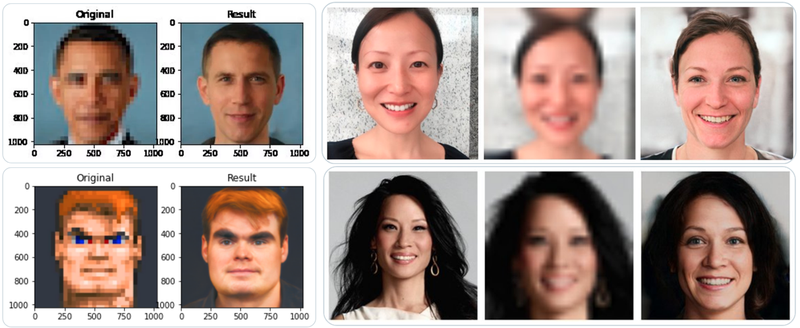
> 출처: [글 이동](https://www.theverge.com/21298762/face-depixelizer-ai-machine-learning-tool-pulse-stylegan-obama-biashttps://www.theverge.com/21298762/face-depixelizer-ai-machine-learning-tool-pulse-stylegan-obama-bias)

[관련 글:공정한 AI 얼굴 인식기](https://www.kakaobrain.com/blog/57)

## 

***

# 프로젝트1. 직접 고른 이미지로 SRGAN 실험

# 1. 프로젝트 1-1. 직접 고른 이미지로 SRGAN 실험 (1)

1. (적당히) 높은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.  
2. 불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 1/4로 줄입니다. cv2.resize()를 사용해 봅시다.  
3. 줄인 저해상도 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.  
4. 2.의 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. 마찬가지로 cv2.resize()를 사용해 봅시다.  
5. 3개 이미지(4.의 Bicubic의 결과, 3.의 SRGAN의 결과, 1.의 원래 고해상도 이미지)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.  
6. 선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다)

### 이미지 불러오기

이미지 shape:  (1080, 1920, 3)


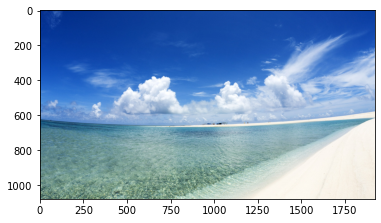

In [1]:
import os
import matplotlib.pyplot as plt
import cv2

image_1_path = os.getcwd() + '/beach.jpg'
hr_image = cv2.cvtColor(cv2.imread(image_1_path), cv2.COLOR_BGR2RGB)
hr_image_shape = hr_image.shape

print('이미지 shape: ', hr_image_shape)

plt.imshow(hr_image)
plt.show()

### 저해상도로 변경

(270, 480, 3)


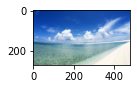

In [2]:
lr_image = cv2.resize(hr_image, dsize=(hr_image_shape[1]//4,hr_image_shape[0]//4)) # (가로 픽셀 수, 세로 픽셀 수)

print(lr_image.shape)

plt.figure(figsize=(3,1))
plt.imshow(lr_image)

 ### bicubic interpolation
 - 가로 및 세로 픽셀 수를 1/4로 줄이기

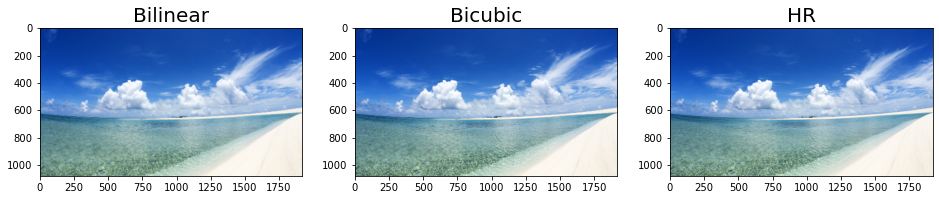

In [3]:
bilinear_image = cv2.resize(
    lr_image, 
    dsize=(1920, 1080), # (가로 픽셀 수, 세로 픽셀 수) 
    interpolation=cv2.INTER_LINEAR # bilinear interpolation 적용
)

bicubic_image = cv2.resize(
    lr_image, 
    dsize=(1920, 1080), # (가로 픽셀 수, 세로 픽셀 수)
    interpolation=cv2.INTER_CUBIC # bicubic interpolation 적용
)

images = [bilinear_image, bicubic_image, hr_image]
titles = ["Bilinear", "Bicubic", "HR"]

plt.figure(figsize=(16,3))
for i, (image, title) in enumerate(zip(images, titles)):
    plt.subplot(1,3,i+1)
    plt.imshow(image)
    plt.title(title, fontsize=20)

### interpolation(보간법)적용 이미지 crop해 확인하기

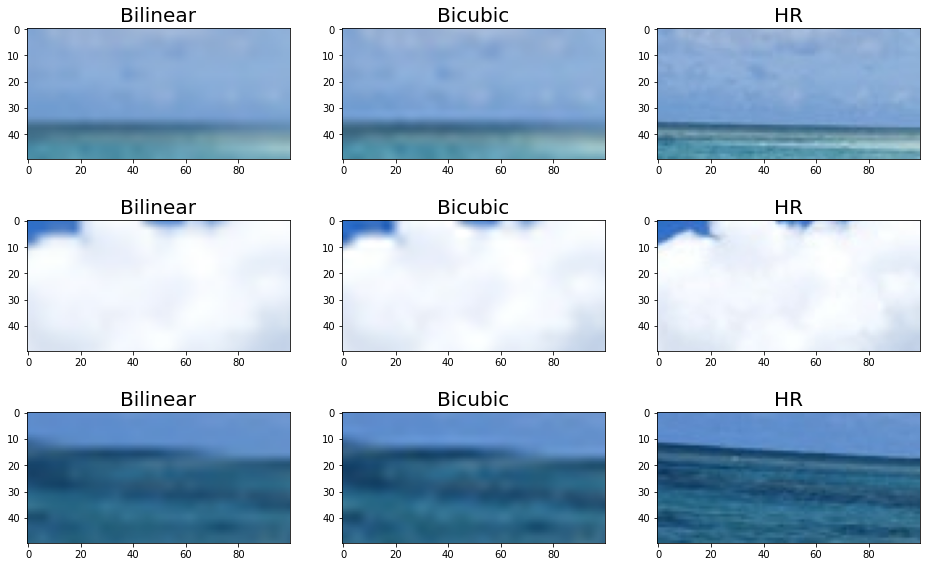

In [4]:
# 특정 영역을 잘라낼 함수를 정의합니다.
def crop(image, left_top, x=50, y=100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]


# 잘라낼 영역의 좌표를 정의합니다.
left_tops = [(620,500)] *3 + [(390,620)] *3 + [(630,200)] *3

plt.figure(figsize=(16,10))
for i, (image, left_top, title) in enumerate(zip(images*3, left_tops, titles*3)):
    plt.subplot(3,3,i+1)
    plt.imshow(crop(image, left_top))
    plt.title(title, fontsize=20)

### ❗코드 파헤치기
- 리스트 내부의 원소를 \*를 이용해 늘려주기  
- zip: 서로 다른 리스트를 원소 순서대로 합치기  
- enumerate: 리스트를 (인덱스, 값)으로 만들어 하나씩 반환해준다.    
- 이미지의 특정 영역만 선택하기: img[세로축 시작:세로축 끝, 가로축 시작:가로축 끝] --> **위에서 정의한 crop 함수 파헤치기**

In [5]:
# 리스트 안의 요소들을 동일하게 늘려주기 위해 * 연산자를 이용했다. 총 원소수는 9개
left_tops = [(620,500)] *3 + [(390,620)] *3 + [(630,200)] *3
print(left_tops)
print('left_tops의 원소 수는: ', len(left_tops))

[(620, 500), (620, 500), (620, 500), (390, 620), (390, 620), (390, 620), (630, 200), (630, 200), (630, 200)]
left_tops의 원소 수는:  9


In [6]:
# zip, enumerate 함수 파헤치기
# for (image, left_top, title) in enumerate(zip(images*3, left_tops, titles*3))

images_ = ['bilinear_image', 'bicubic_image', 'hr_image'] # 설명을 위해 string로 변형했다.
# left_tops = [(620, 500), (620, 500), (620, 500), (390, 620), (390, 620), (390, 620), (630, 200), (630, 200), (630, 200)] 위에서 정의했지만 설명을 위해 전체 리스트 나열함.
titles = ["Bilinear", "Bicubic", "HR"]

# zip 함수 내부의 인자는 이렇게 생겼다.
print('zip 내부의 인자의 첫 번째는: ',images_*3)
print('\n')
print('zip 내부의 인자의 두 번째는: ',left_tops)
print('\n')
print('zip 내부의 인자의 세 번째는: ',titles*3)
print('\n')

# zip을 이용하면 images*3의 첫 번째 원소, left_tops의 첫 번째 원소, titles*3의 첫 번째 원소가 차례로 나와 합쳐진다. 아래 코드를 보자.
print('zip 설명')
for i in zip(images_*3, left_tops, titles*3):
    print(i)
    
print('\n')    

# enumerate를 이용하면 리스트의 (인덱스, 값)을 차례로 뽑아낼 수 있다. 아래 예시를 보자.
print('enumerate 설명')
for i,j in enumerate(zip(images_*3, left_tops, titles*3)):
    print(i,j)

zip 내부의 인자의 첫 번째는:  ['bilinear_image', 'bicubic_image', 'hr_image', 'bilinear_image', 'bicubic_image', 'hr_image', 'bilinear_image', 'bicubic_image', 'hr_image']


zip 내부의 인자의 두 번째는:  [(620, 500), (620, 500), (620, 500), (390, 620), (390, 620), (390, 620), (630, 200), (630, 200), (630, 200)]


zip 내부의 인자의 세 번째는:  ['Bilinear', 'Bicubic', 'HR', 'Bilinear', 'Bicubic', 'HR', 'Bilinear', 'Bicubic', 'HR']


zip 설명
('bilinear_image', (620, 500), 'Bilinear')
('bicubic_image', (620, 500), 'Bicubic')
('hr_image', (620, 500), 'HR')
('bilinear_image', (390, 620), 'Bilinear')
('bicubic_image', (390, 620), 'Bicubic')
('hr_image', (390, 620), 'HR')
('bilinear_image', (630, 200), 'Bilinear')
('bicubic_image', (630, 200), 'Bicubic')
('hr_image', (630, 200), 'HR')


enumerate 설명
0 ('bilinear_image', (620, 500), 'Bilinear')
1 ('bicubic_image', (620, 500), 'Bicubic')
2 ('hr_image', (620, 500), 'HR')
3 ('bilinear_image', (390, 620), 'Bilinear')
4 ('bicubic_image', (390, 620), 'Bicubic')
5 ('hr_image', (390

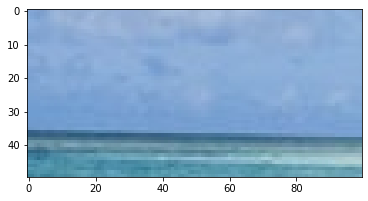

In [7]:
# crop 함수 파헤치기

def crop(image, left_top, x=50, y=100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

#for i, (image, left_top, title) in enumerate(zip(images*3, left_tops, titles*3)):
    """
    위에서 보듯이 0 ('bilinear_image', (620, 500), 'Bilinear') 을 시작으로 8 ('hr_image', (630, 200), 'HR') 까지 순차적으로
    i, image, left_top, title에 할당되어 crop함수에 들어간다.
    첫 번째 값인 0 ('bilinear_image', (620, 500), 'Bilinear')을 살펴보자.
    """
   # plt.subplot(3,3,i+1)
   # plt.imshow(crop(image, left_top))
    """    
i = 0은 plt.subplot(3,3,0+1)로 들어가 subplot의 위치를 설정하게 된다.
crop함수 내부로는 crop(bilinear_image, (620, 500))가 들어가게 된다.
return값을 보면 bilinear_image[620:620+50, 500:500+100,:] 이라는 값이 반환된다.

이것의 의미는 세로축 범위(620~670)과 가로축 범위(500~600) 사이의 영역만 선택하게 된다.
선택 영역의 숫자를 변경해보면서 원본과 비교해보면 어렵지 않게 이해할 수 있다.
"""

plt.imshow(hr_image[620:670, 500:600])

### ❓의문점
- `crop`함수의 반환값을 보면 이미지[세로축 범위, 가로축 범위, :]을 했는데, 마지막에 있는 **:**은 어떤 의미인지 모르겠다. 아래 두 그림을 봐도 잘...  
- SAAC의 박정은님의 답변 덕분에 해결할 수 있었다.  
- 맨 뒤의 :의 의미는 0~2까지의 모든 범위를 알려주는 것!  cv2를 이용해 이미지를 불러오면 BGR값으로 불러오는데 맨 뒤의 숫자를 0부터 차례대로 2까지 넣어서 시각화해보면 BGR, RGB에 해당하는 그림을 확인할 수 있다.

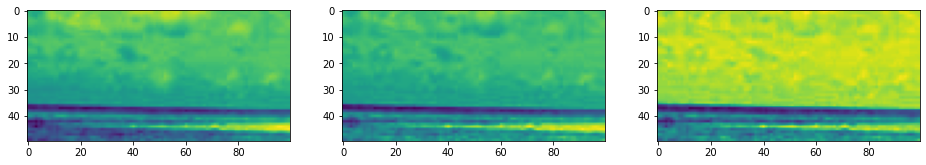

In [8]:
# R,G,B 각각 채널에 해당하는 이미지를 시각화할 수 있다.

plt.figure(figsize=(16,10))
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(hr_image[620:670, 500:600,i])

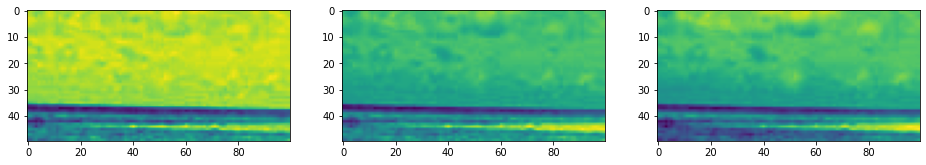

In [9]:
# B, G, R 각각 채널에 해당하는 이미지를 시각화할 수 있다.

hr_image_bgr = cv2.imread(image_1_path)

plt.figure(figsize=(16,10))
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(hr_image_bgr[620:670, 500:600,i])

### SRGAN을 이용해 고해상도 이미지 생성
- 줄인 저해상도 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.

In [10]:
import tensorflow as tf
import os

model_file = os.getcwd()+'/model/srgan_G.h5'
srgan = tf.keras.models.load_model(model_file)

In [11]:
import tensorflow_datasets as tfds
import numpy as np
def apply_srgan(image):
    image = tf.cast(image[np.newaxis, ...], tf.float32)
    sr = srgan.predict(image)
    sr = tf.clip_by_value(sr, 0, 255)
    sr = tf.round(sr)
    sr = tf.cast(sr, tf.uint8)
    return np.array(sr)[0]

srgan_hr = apply_srgan(lr_image)
print("✅")

✅


### (원본 이미지 -> bicubic interpolation(원본의 1/4크기))이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘리기

In [12]:
bicubic_hr = cv2.resize(
    lr_image, 
    dsize=(1920, 1080), # (가로 픽셀 수, 세로 픽셀 수)
    interpolation=cv2.INTER_CUBIC # bicubic interpolation 적용
)

### 3개 이미지(Bicubic의 결과, SRGAN의 결과, 원래 고해상도 이미지)를 나란히 시각화
- crop 이미지를 확인해보니 SRGAN의 이미지가 좀 더 선명한 느낌이다.  
- PSNR, SSIM 등의 지표를 이용해 확인해보자.

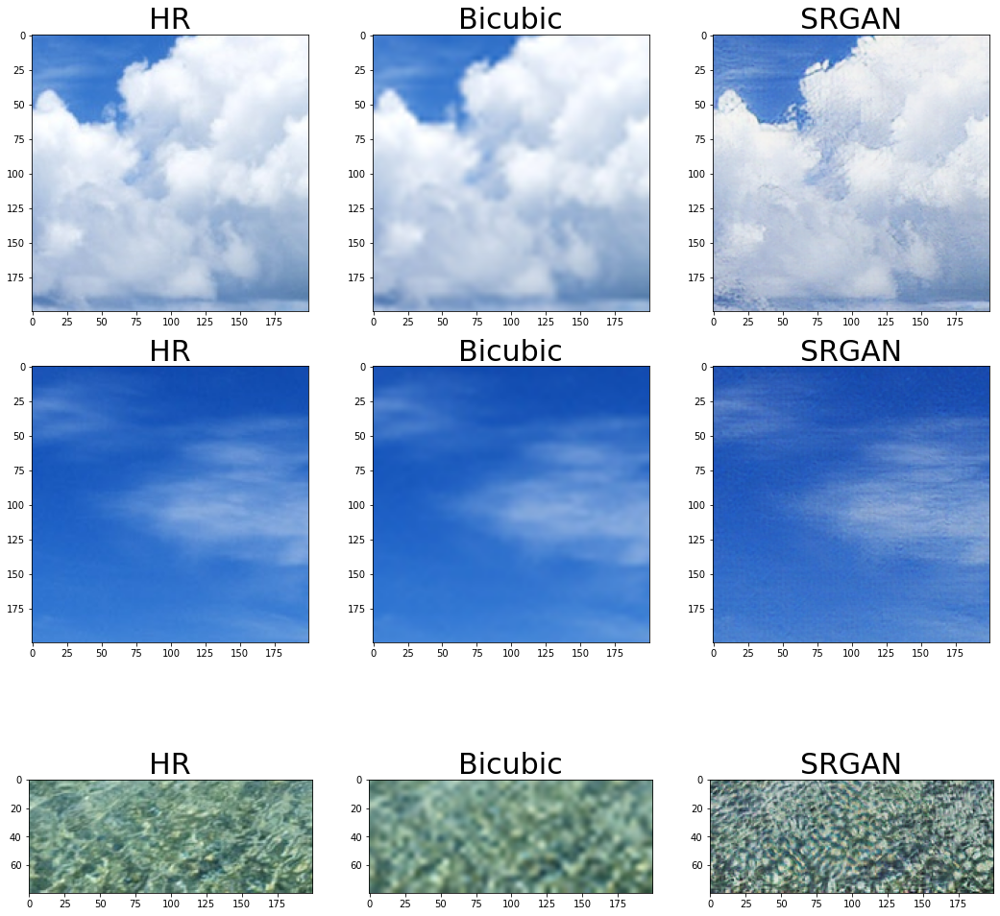

In [13]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(400,500), (300,200), (1000,100)]

images = []
for left_top in left_tops:
    img1 = crop(hr_image, left_top, 200, 200)
    img2 = crop(bicubic_hr, left_top, 200, 200)
    img3 = crop(srgan_hr , left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["HR","Bicubic", "SRGAN"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

### DIV2K 데이터셋에서 학습된 모델로 Super Resolution
- 평가 지표: PSNR, SSIM

In [14]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

print("**원본 이미지 <-> 원본 이미지**")
print("PSNR :", peak_signal_noise_ratio(hr_image, hr_image))
print("SSIM :", structural_similarity(hr_image, hr_image, multichannel=True))
print("**원본 이미지 <-> bicubic interpolation**")
print("PSNR :", peak_signal_noise_ratio(hr_image, bicubic_hr))
print("SSIM :", structural_similarity(hr_image, bicubic_hr, multichannel=True))
print("**원본 이미지 <-> srgan**")
print("PSNR :", peak_signal_noise_ratio(hr_image, srgan_hr))
print("SSIM :", structural_similarity(hr_image, srgan_hr, multichannel=True))

**원본 이미지 <-> 원본 이미지**
PSNR : inf


/home/aiffel-dj40/Downloads/exit/envs/aiffel/lib/python3.7/site-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


SSIM : 1.0
**원본 이미지 <-> bicubic interpolation**
PSNR : 30.300225370857298
SSIM : 0.8434074513709766
**원본 이미지 <-> srgan**
PSNR : 22.679712816142604
SSIM : 0.6320815121833748


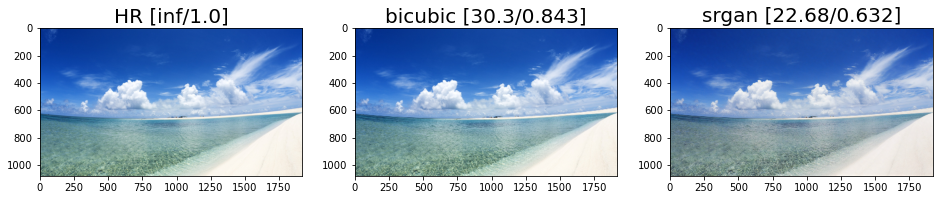

In [15]:
images = [hr_image, bicubic_hr, srgan_hr]
titles = ["HR", "bicubic", "srgan"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_image, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_image, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(16,10))
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=20)

**위의 결과를 보면 수치상으로 bicubic가 높다.**  
사람이 눈으로 판단하는 결과와 지표 상의 결과가 보여주는 것이 상이한 점이 있다.  
아래 코드는 원본 이미지를 일정한 비율로 축소했을 때 어떻게 바뀌는 지 시각화했다.

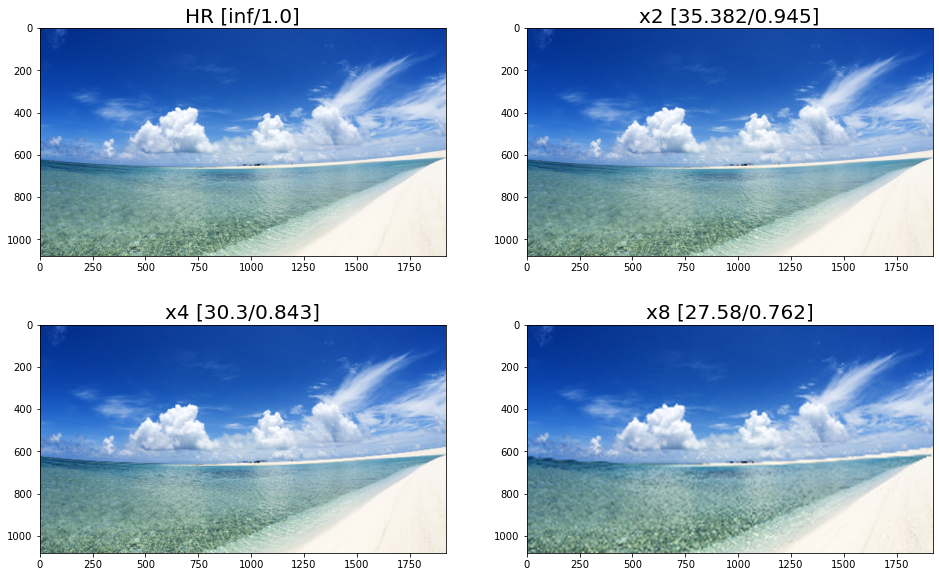

In [16]:
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

# 이미지를 특정 크기로 줄이고 다시 늘리는 과정을 함수로 정의합니다.
def interpolation_xn(image, n):
    downsample = cv2.resize(
        image,
        dsize=(hr_image_shape[1]//n, hr_image_shape[0]//n)
    )
    upsample = cv2.resize(
        downsample,
        dsize=(hr_image_shape[1], hr_image_shape[0]),
        interpolation=cv2.INTER_CUBIC
    )
    return upsample

lr2_cat = interpolation_xn(hr_image, 2) # 1/2로 줄이고 다시 복원
lr4_cat = interpolation_xn(hr_image, 4) # 1/4로 줄이고 다시 복원
lr8_cat = interpolation_xn(hr_image, 8) # 1/8로 줄이고 다시 복원

images = [hr_image, lr2_cat, lr4_cat, lr8_cat]
titles = ["HR", "x2", "x4", "x8"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_image, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_image, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(16,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=20)

***

# 2. 프로젝트 1-2.

1. (적당히) 낮은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.  
2. 불러온 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.  
3. 1.에서 불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. cv2.resize()를 사용해 봅시다.  
4. 2개 이미지(3.의 Bicubic의 결과, 2.의 SRGAN의 결과)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.  
5. 선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다)  

### 이미지 불러오기

이미지 shape:  (290, 290, 3)


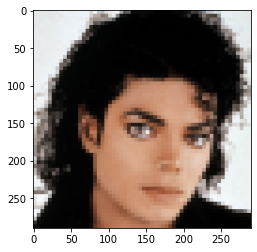

In [20]:
import os
import matplotlib.pyplot as plt
import cv2

image_1_path = os.getcwd() + '/mj.jpg'
lr_image = cv2.cvtColor(cv2.imread(image_1_path), cv2.COLOR_BGR2RGB)
lr_image_shape = lr_image.shape

print('이미지 shape: ', lr_image_shape)

plt.imshow(lr_image)
plt.show()

 ### interpolation
 - 가로 및 세로 픽셀 수를 8배 키우기

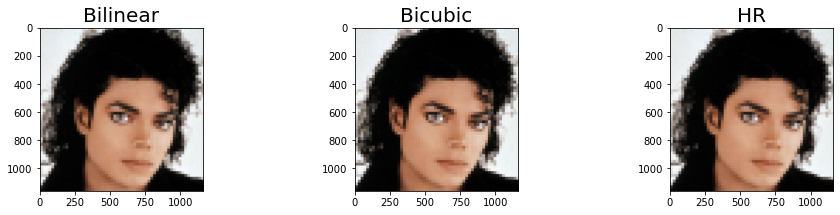

In [26]:
scale = 4

bilinear_image = cv2.resize(
    lr_image, 
    dsize=(lr_image_shape[1]*scale, lr_image_shape[0]*scale), # (가로 픽셀 수, 세로 픽셀 수) 
    interpolation=cv2.INTER_LINEAR # bilinear interpolation 적용
)

bicubic_image = cv2.resize(
    lr_image, 
    dsize=(lr_image_shape[1]*scale, lr_image_shape[0]*scale), # (가로 픽셀 수, 세로 픽셀 수)
    interpolation=cv2.INTER_CUBIC # bicubic interpolation 적용
)

hr_image = cv2.resize(lr_image, dsize=(lr_image_shape[1]*scale, lr_image_shape[0]*scale))

images = [bilinear_image, bicubic_image, hr_image]
titles = ["Bilinear", "Bicubic", "HR"]

plt.figure(figsize=(16,3))
for i, (image, title) in enumerate(zip(images, titles)):
    plt.subplot(1,3,i+1)
    plt.imshow(image)
    plt.title(title, fontsize=20)

### interpolation(보간법)적용 이미지 crop해 확인하기

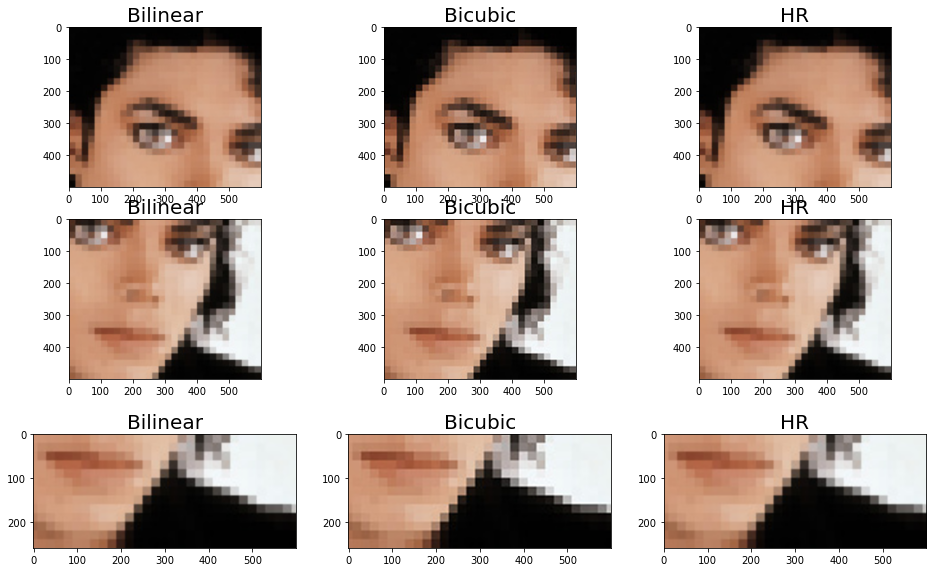

In [29]:
# 특정 영역을 잘라낼 함수를 정의합니다.
def crop(image, left_top, x=500, y=600):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]


# 잘라낼 영역의 좌표를 정의합니다.
left_tops = [(300,300)] *3 + [(600,500)] *3 + [(900,550)] *3

plt.figure(figsize=(16,10))
for i, (image, left_top, title) in enumerate(zip(images*3, left_tops, titles*3)):
    plt.subplot(3,3,i+1)
    plt.imshow(crop(image, left_top))
    plt.title(title, fontsize=20)

### SRGAN을 이용해 고해상도 이미지 생성
- 줄인 저해상도 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.

In [23]:
# image_1_path = os.getcwd() + '/mj.jpg'
# lr_image = cv2.cvtColor(cv2.imread(image_1_path), cv2.COLOR_BGR2RGB)

srgan_hr = apply_srgan(lr_image)
print(srgan_hr.shape)

(1160, 1160, 3)


### 3개 이미지(Bicubic의 결과, SRGAN의 결과, 원래 고해상도 이미지)를 나란히 시각화
- crop 이미지를 확인해보니 SRGAN의 이미지가 좀 더 선명한 느낌이다.  
- PSNR, SSIM 등의 지표를 이용해 확인해보자.

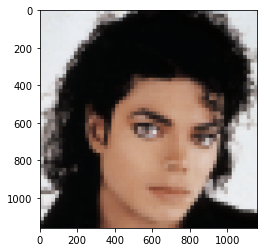

In [31]:
plt.imshow(srgan_hr)

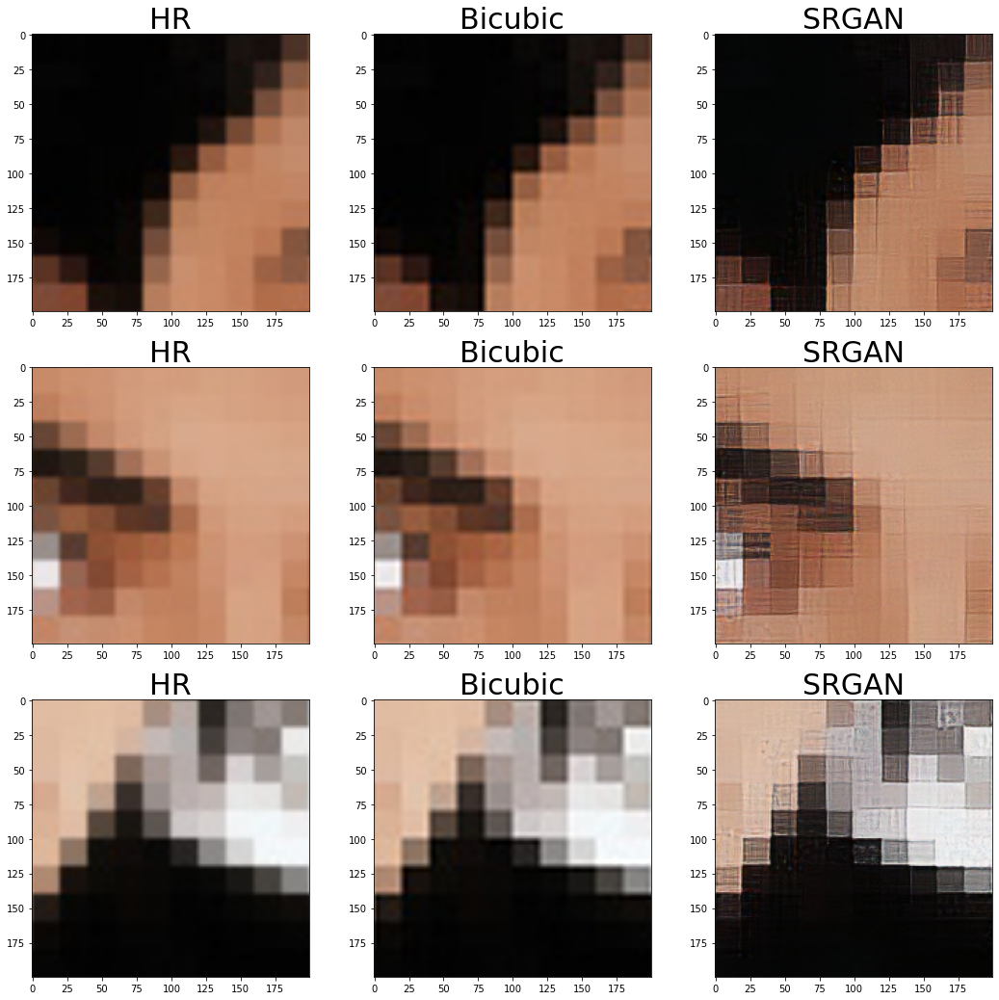

In [32]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(400,300), (500,600), (900,800)]

images = []
for left_top in left_tops:
    img1 = crop(hr_image, left_top, 200, 200)
    img2 = crop(bicubic_image, left_top, 200, 200)
    img3 = crop(srgan_hr , left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["HR","Bicubic", "SRGAN"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

### DIV2K 데이터셋에서 학습된 모델로 Super Resolution
- 평가 지표: PSNR, SSIM

In [34]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

print("**원본 이미지 <-> 원본 이미지**")
print("PSNR :", peak_signal_noise_ratio(hr_image, hr_image))
print("SSIM :", structural_similarity(hr_image, hr_image, multichannel=True))
print("**원본 이미지 <-> bicubic interpolation**")
print("PSNR :", peak_signal_noise_ratio(hr_image, bicubic_image))
print("SSIM :", structural_similarity(hr_image, bicubic_image, multichannel=True))
print("**원본 이미지 <-> srgan**")
print("PSNR :", peak_signal_noise_ratio(hr_image, srgan_hr))
print("SSIM :", structural_similarity(hr_image, srgan_hr, multichannel=True))

**원본 이미지 <-> 원본 이미지**
PSNR : inf
SSIM : 1.0
**원본 이미지 <-> bicubic interpolation**
PSNR : 41.6390731814451
SSIM : 0.9854026598889388
**원본 이미지 <-> srgan**
PSNR : 28.099919998954963
SSIM : 0.7492728829212085


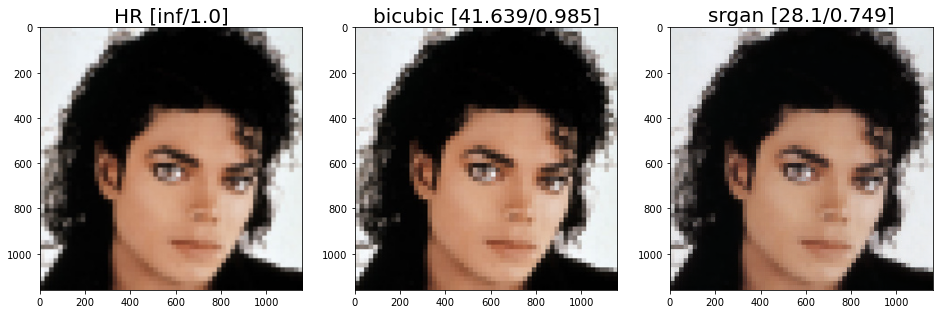

In [35]:
images = [hr_image, bicubic_image, srgan_hr]
titles = ["HR", "bicubic", "srgan"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_image, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_image, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(16,10))
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=20)

**위의 결과를 보면 수치상으로 bicubic가 높다.**  
사람이 눈으로 판단하는 결과와 지표 상의 결과가 보여주는 것이 상이한 점이 있다.  
아래 코드는 원본 이미지를 일정한 비율로 축소했을 때 어떻게 바뀌는 지 시각화했다.

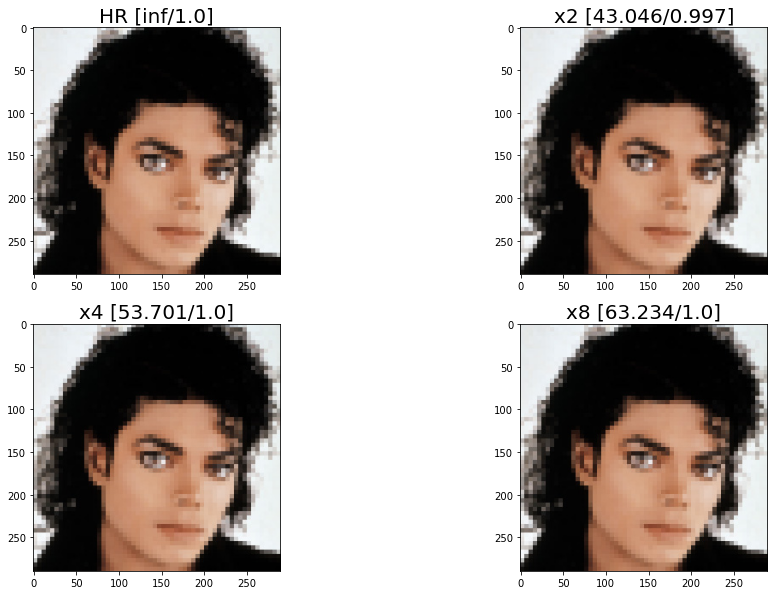

In [40]:
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

# 이미지를 특정 크기로 줄이고 다시 늘리는 과정을 함수로 정의합니다.
def interpolation_xn(image, n):
    upsample = cv2.resize(
        image,
        dsize=(lr_image_shape[1]*n, lr_image_shape[0]*n),
        interpolation=cv2.INTER_CUBIC
    )
    
    downsample = cv2.resize(
                        upsample,
                        dsize=(lr_image_shape[1], lr_image_shape[0]))
    
    return downsample

lr2_cat = interpolation_xn(lr_image, 2) # 1/2로 줄이고 다시 복원
lr4_cat = interpolation_xn(lr_image, 4) # 1/4로 줄이고 다시 복원
lr8_cat = interpolation_xn(lr_image, 8) # 1/8로 줄이고 다시 복원

images = [lr_image, lr2_cat, lr4_cat, lr8_cat]
titles = ["HR", "x2", "x4", "x8"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(lr_image, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(lr_image, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(16,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=20)

***

# 3. 프로젝트2. SRGAN을 이용해 고해상도 gif 생성하기

### gif 파일 불러오기

![wine_lr](wine_lr.gif)

In [41]:
import cv2

# 다운받은 파일의 경로를 설정해 주세요.
gif = cv2.VideoCapture("wine_lr.gif")

isTrue = True
frames = []
while isTrue:
    isTrue, frame = gif.read()
    if isTrue:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)

print("frame 수 :", len(frames))
print("frame 크기 :", (frames[0].shape))

frame 수 : 13
frame 크기 : (340, 355, 3)


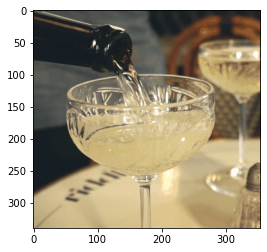

In [42]:
# 한 프레임 이미지 시각화
plt.imshow(frames[10])

### 프레임별 Super Resolution 진행하기
- Bicubic interpolation과 SRGAN을 이용해 각각의 가로, 세로 픽셀 수를 4배로 늘리기  
Super Resolution이 완료된 각각의 결과를 frames_sr이라는 리스트에 넣기

In [ ]:
frames_sr_bicubic = []
frames_sr_gan = []

for i in range(3):

    bicubic_image = cv2.resize(
        frames[i], 
        dsize=(frames[i].shape[1]*4, frames[i].shape[0]*4), # (가로 픽셀 수, 세로 픽셀 수)
        interpolation=cv2.INTER_CUBIC # bicubic interpolation 적용
    )
    frames_sr_bicubic.append(bicubic_image)
    
    srgan_hr = apply_srgan(frames[i])
    frames_sr_gan.append(srgan_hr)

### Bicubic interpolation과 SRGAN 결과 시각화

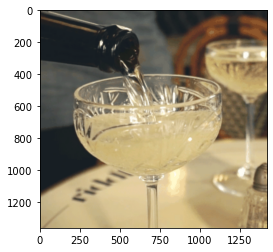

In [58]:
# 원본 이미지 3장만
frame = []
for i in range(3):
    resize = cv2.resize(frames[i], 
                       dsize=(frames[i].shape[1]*4, frames[i].shape[0]*4))
    frame.append(resize)
plt.imshow(frame[0])

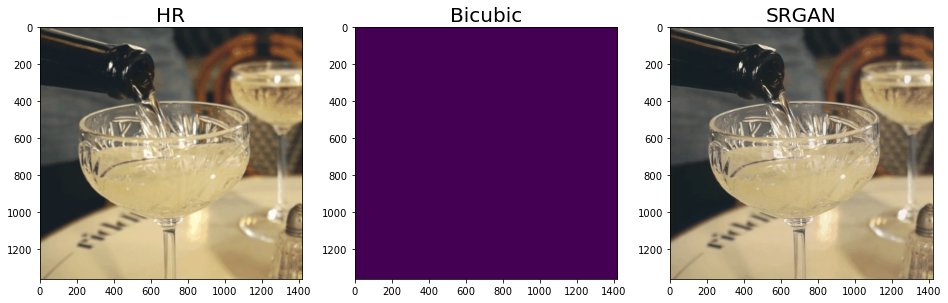

In [61]:
images = [frame, frames_sr_bicubic, frames_sr_gan]
titles = ["HR", "Bicubic", "SRGAN"]

plt.figure(figsize=(16,10))
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(images[i][0])
    plt.title(titles[i], fontsize=20)

###  프레임을 합쳐 gif 만들기

In [ ]:
import imageio

imageio.mimsave("고해상도_bicubic.gif", frames_sr_bicubic)
imageio.mimsave("고해상도_srgan.gif", frames_sr_gan)

In [ ]:
from IPython.display import Image as show_gif

show_gif("wine_lr.gif", width=800) # width 는 적당히 큰 값으로 설정해주세요

In [ ]:
from IPython.display import Image as show_gif
# bicubic으로 만든 gif
show_gif("고해상도_bicubic.gif", width=800) # width 는 적당히 큰 값으로 설정해주세요

In [ ]:
# srgan으로 만든 gif
show_gif("고해상도_srgan.gif", width=800) # width 는 적당히 큰 값으로 설정해주세요

***

# 4. 회고

## 4-1. 루브릭
### 1. SRGAN을 이용해 고해상도의 이미지를 생성하였다.
- SRGAN기법을 이용해 고해상도 이미지 생성 완료!  

### 2. 다양한 해상도의 이미지에 대해 시각화를 통해 원본, SRGAN생성본, interpolation생성본을 비교분석하였다.
- 원본 이미지, SRGAN, bicubic interpolation 생성본에 대해 시각적, PSNR, SSIM 등으로 비교 분석함  

### 3. 저해상도 gif 동영상을 고해상도 동영상으로 성공적으로 변환하였다.
- 저해상도 gif 동영상을 고해상도 동영상으로 변환 성공 (원본 대비 4배 이상)  

## 4-2. 회고
1. 이전에 배웠던 CNN, GAN에 대한 확장 개념을 배울 수 있었다.  
2. Super Resolution에 대한 개념과 이해를 할 수 있었다.  
3. **의문 해결: `plt.imshow(hr_image[620:670, 500:600,:])`부분에서 맨 뒤의 : 부분이 의미하는 바가 RGB 채널의 이미지를 나타내는 것을 알아냄. [plt.imshow 관련 링크](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html)  
4. bicubic, srgan을 이용해 이미지 SR 적용하는 방법을 익힐 수 있었다.  
5. 또한 이미지 시각화하는 부분에서 subplot를 활용해 다양하게 plotting을 시도해 볼 수 있었다.  
6. 그리고 PSNR, SSIM등의 수치가 실제 사람이 눈으로 보는 화질과는 다소 차이가 있음을 알게 되어 이 간극을 채우는 것이 중요한 것 같다.  
7. 프로젝트 1-2에서 사진이 아니라 그림 파일을 가지고 진행했는데, 역시 여기서에서도 gan을 활용하는 것이 좀 더 효과적인 것을 알 수 있었다.